In [1]:
#import important liberies
import pandas as pd
import numpy as np

#visualisation liberies
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#.rdata file reader
import pyreadr

#zipfile extract
import zipfile as zp

#sklearn
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import cross_val_score, KFold, train_test_split

# # Import the required libraries
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
import sklearn

In [6]:
xgb.__version__

'2.0.0'

# Prepare Data

## Extract Data

Converting .rData into dataframe

In [4]:
#extract from zipfile
with zp.ZipFile("dataset\TEP_FaultFree_Training.RData (1).zip", 'r') as zip_ref:
    zip_ref.extractall("dataset")
with zp.ZipFile("dataset/TEP_Faulty_Training.RData.zip", 'r') as zip_ref:
    zip_ref.extractall("dataset")


# pyreadr converts rData into dictionary type object.
result = pyreadr.read_r("dataset/TEP_Faulty_Training.RData")
result1 = pyreadr.read_r("dataset/TEP_FaultFree_Training.RData")
result2 = pyreadr.read_r("/kaggle/input/tennessee-eastman-process-simulation-dataset/TEP_FaultFree_Testing.RData")
result3 = pyreadr.read_r("/kaggle/input/tennessee-eastman-process-simulation-dataset/TEP_Faulty_Testing.RData")

#dataframes
df_train = result['faulty_training']
df_ff = result1['fault_free_training']
df_test = result2['fault_free_testing']
df_test_ff = result3['faulty_testing']

#save in csv file
df_ff.to_csv("dataset/fault_free_training.csv")
df_train.to_csv("dataset/faulty_training.csv")

In [2]:
df_ff = pd.read_csv("dataset/fault_free_training.csv",index_col="Unnamed: 0")
df_faulty = pd.read_csv("dataset/faulty_training.csv",index_col="Unnamed: 0")

## Transform Data

In [5]:
df = pd.concat([df_faulty,df_ff])
# dft = pd.concat([df_test,df_test_ff])

In [10]:
print("len df:",len(df))
# print("len dft:",len(dft))
df.head()

len df: 5250000


,faultNumber,simulationRun,sample,xmeas_1,xmeas_2,xmeas_3,xmeas_4,xmeas_5,xmeas_6,xmeas_7,...,xmv_2,xmv_3,xmv_4,xmv_5,xmv_6,xmv_7,xmv_8,xmv_9,xmv_10,xmv_11
0,1.0,1.0,1,0.25038,3674.0,4529.0,9.2320,26.889,42.402,2704.3,...,53.744,24.657,62.544,22.137,39.935,42.323,47.757,47.510,41.258,18.447
1,1.0,1.0,2,0.25109,3659.4,4556.6,9.4264,26.721,42.576,2705.0,...,53.414,24.588,59.259,22.084,40.176,38.554,43.692,47.427,41.359,17.194
2,1.0,1.0,3,0.25038,3660.3,4477.8,9.4426,26.875,42.070,2706.2,...,54.357,24.666,61.275,22.380,40.244,38.990,46.699,47.468,41.199,20.530
3,1.0,1.0,4,0.24977,3661.3,4512.1,9.4776,26.758,42.063,2707.2,...,53.946,24.725,59.856,22.277,40.257,38.072,47.541,47.658,41.643,18.089
4,1.0,1.0,5,0.29405,3679.0,4497.0,9.3381,26.889,42.650,2705.1,...,53.658,28.797,60.717,21.947,39.144,41.955,47.645,47.346,41.507,18.461


In [5]:
df_test = pd.DataFrame(data=["predict"],columns=["Action"])
dft = pd.concat([df_test, df[(df["simulationRun"]==1) & ((df["sample"]==30) | (df["sample"]==40) | (df["sample"]==50) | (df["sample"]==60) | (df["sample"]==70))].iloc[:100,3:]])
dft.fillna(method="ffill",inplace=True)
# dft.reset_index()
dft.dropna(inplace=True)

In [6]:
df.columns

Index(['faultNumber', 'simulationRun', 'sample', 'xmeas_1', 'xmeas_2',
       'xmeas_3', 'xmeas_4', 'xmeas_5', 'xmeas_6', 'xmeas_7', 'xmeas_8',
       'xmeas_9', 'xmeas_10', 'xmeas_11', 'xmeas_12', 'xmeas_13', 'xmeas_14',
       'xmeas_15', 'xmeas_16', 'xmeas_17', 'xmeas_18', 'xmeas_19', 'xmeas_20',
       'xmeas_21', 'xmeas_22', 'xmeas_23', 'xmeas_24', 'xmeas_25', 'xmeas_26',
       'xmeas_27', 'xmeas_28', 'xmeas_29', 'xmeas_30', 'xmeas_31', 'xmeas_32',
       'xmeas_33', 'xmeas_34', 'xmeas_35', 'xmeas_36', 'xmeas_37', 'xmeas_38',
       'xmeas_39', 'xmeas_40', 'xmeas_41', 'xmv_1', 'xmv_2', 'xmv_3', 'xmv_4',
       'xmv_5', 'xmv_6', 'xmv_7', 'xmv_8', 'xmv_9', 'xmv_10', 'xmv_11'],
      dtype='object')

### About data

The TEP is comprised of 8 chemical components in total: 4 reactants, 2 products, 1 by-product and 1 inert component. These components undergo a chemical process dominated by 5 main process units: a reactor that allows for the reaction of the gaseous feed components (A, C, D and E) into liquid products (G and H), a condenser to cool-down the gaseous product stream coming out of the reactor, a gas-liquid separator to split gas and liquid components from the cooled product stream, a centrifugal compressor to flow this gas stream back into the reactor and a stripper to handle the efficient separation of the 2 products from any unreacted feed components. There is also a purge to remove the inert (B) and the by-product (F) from the system . An overview of the industrial process is given below.

![TEP_Flow](https://www.ieee-dataport.org/sites/default/files/TE_flow.jpg)



In [7]:
X_dict = {
'XMEAS_1':'A_feed_stream',
'XMEAS_2':'D_feed_stream',
'XMEAS_3':'E_feed_stream',
'XMEAS_4':'Total_fresh_feed_stripper',
'XMEAS_5':'Recycle_flow_into_rxtr',
'XMEAS_6':'Reactor_feed_rate',
'XMEAS_7':'Reactor_pressure',
'XMEAS_8':'Reactor_level',
'XMEAS_9':'Reactor_temp',
'XMEAS_10':'Purge_rate',
'XMEAS_11':'Separator_temp',
'XMEAS_12':'Separator_level',
'XMEAS_13':'Separator_pressure',
'XMEAS_14':'Separator_underflow',
'XMEAS_15':'Stripper_level',
'XMEAS_16':'Stripper_pressure',
'XMEAS_17':'Stripper_underflow',
'XMEAS_18':'Stripper_temperature',
'XMEAS_19':'Stripper_steam_flow',
'XMEAS_20':'Compressor_work',
'XMEAS_21':'Reactor_cooling_water_outlet_temp',
'XMEAS_22':'Condenser_cooling_water_outlet_temp',
'XMEAS_23':'Composition_of_A_rxtr_feed',
'XMEAS_24':'Composition_of_B_rxtr_feed',
'XMEAS_25':'Composition_of_C_rxtr_feed',
'XMEAS_26':'Composition_of_D_rxtr_feed',
'XMEAS_27':'Composition_of_E_rxtr_feed',
'XMEAS_28':'Composition_of_F_rxtr_feed',
'XMEAS_29':'Composition_of_A_purge',
'XMEAS_30':'Composition_of_B_purge',
'XMEAS_31':'Composition_of_C_purge',
'XMEAS_32':'Composition_of_D_purge',
'XMEAS_33':'Composition_of_E_purge',
'XMEAS_34':'Composition_of_F_purge',
'XMEAS_35':'Composition_of_G_purge',
'XMEAS_36':'Composition_of_H_purge',
'XMEAS_37':'Composition_of_D_product',
'XMEAS_38':'Composition_of_E_product',
'XMEAS_39':'Composition_of_F_product',
'XMEAS_40':'Composition_of_G_product',
'XMEAS_41':'Composition_of_H_product',
'XMV_1':'D_feed_flow_valve',
'XMV_2':'E_feed_flow_valve',
'XMV_3':'A_feed_flow_valve',
'XMV_4':'Total_feed_flow_stripper_valve',
'XMV_5':'Compressor_recycle_valve',
'XMV_6':'Purge_valve',
'XMV_7':'Separator_pot_liquid_flow_valve',
'XMV_8':'Stripper_liquid_product_flow_valve',
'XMV_9':'Stripper_steam_valve',
'XMV_10':'Reactor_cooling_water_flow_valve',
'XMV_11':'Condenser_cooling_water_flow_valve',
'XMV_12':'Agitator_speed'
}
# df = df.rename(columns = lambda x:X_dict[x.upper()] if x.upper() in X_dict.keys()  else x)
# dft = dft.rename(columns = lambda x:X_dict[x.upper()] if x.upper() in X_dict.keys()  else x)

## Explore: EDA

The TEP variables (columns 4 to 55) were sampled every 3 minutes for a total duration of 25 hours and 48 hours respectively.
The faults were introduced 1 hour into the Faulty Training
and 8 hours into Faulty Testing datasets

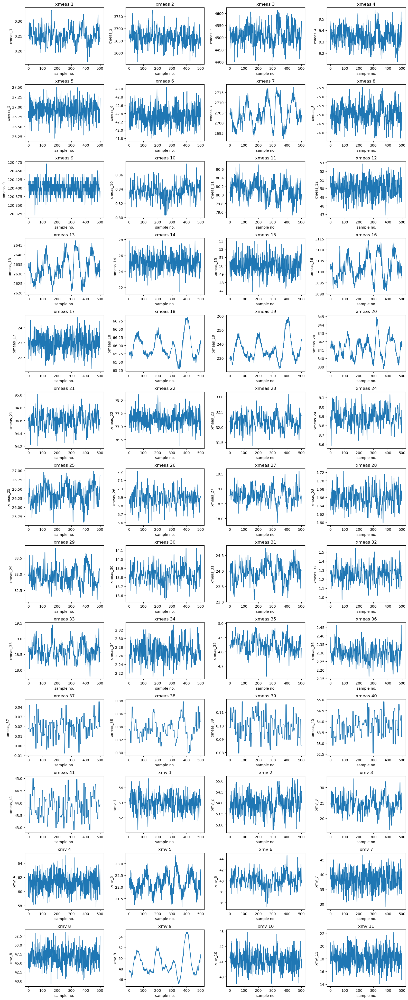

In [14]:
pp= df[(df['faultNumber']==0) & (df['simulationRun']==1)]
feature_columns = df.columns[3:]
num_features = len(feature_columns)
num_cols = min(4, num_features)  # Maximum of 4 columns
num_rows = int(np.ceil(num_features / num_cols))

fig, axes = plt.subplots(num_rows, num_cols, figsize=(4 * num_cols, 3 * num_rows))

for i, col in enumerate(feature_columns):
    row_index = i // num_cols
    col_index = i % num_cols
    ax = axes[row_index, col_index]

    ax.plot(pp['sample'], pp[col])
    ax.set_xlabel('sample no.')
    ax.set_ylabel(col)
    ax.set_title(col.replace("_"," "))

for i in range(num_features, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()


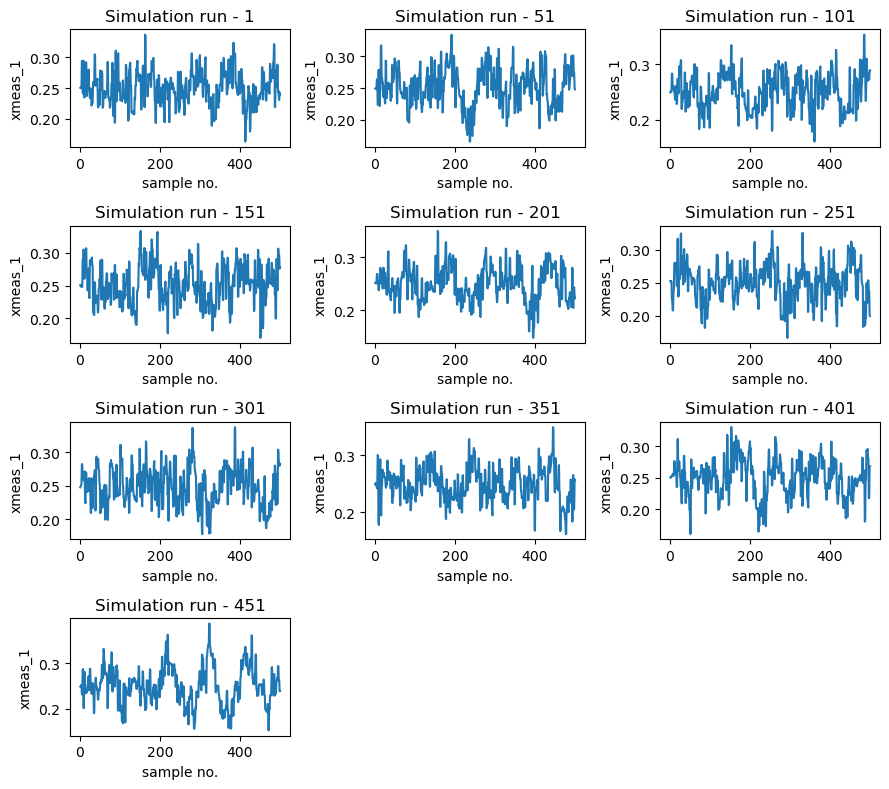

In [12]:
# col = 'A_feed_stream'
col = 'xmeas_1'
simRuns = np.arange(1, 500, 50)
num_simRuns = len(simRuns)
num_cols = min(3, num_simRuns)  # Maximum of 2 columns
num_rows = int(np.ceil(num_simRuns / num_cols))

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(3 * num_cols, 2
                                                      * num_rows))

for i, simRun in enumerate(simRuns):
    pp = df[(df['faultNumber'] == 0) & (df['simulationRun'] == simRun)]
    row_index = i // num_cols
    col_index = i % num_cols
    ax = axes[row_index, col_index]
    ax.plot(pp['sample'], pp[col])
    ax.set_xlabel('sample no.')
    ax.set_ylabel(col)
    ax.set_title(f'Simulation run - {simRun}')

# Remove any empty subplots
for i in range(num_simRuns, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()

plt.show()


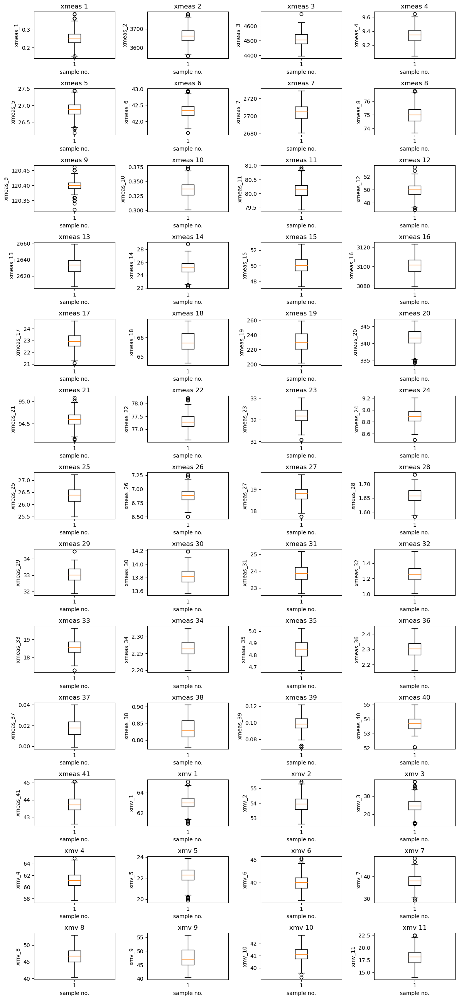

In [13]:
# feature_columns = df.columns[3:]
# num_features = len(feature_columns)
# num_cols = min(4, num_features)  # Maximum of 4 columns
# num_rows = int(np.ceil(num_features / num_cols))

# fig, axes = plt.subplots(num_rows, num_cols, figsize=(3 * num_cols, 2* num_rows))

# for i, col in enumerate(feature_columns):
#     row_index = i // num_cols
#     col_index = i % num_cols
#     ax = axes[row_index, col_index]
#     ax.boxplot(pp[col])
#     ax.set_xlabel('sample no.')
#     ax.set_ylabel(col)
#     ax.set_title(col.replace("_"," "))

# for i in range(num_features, num_rows * num_cols):
#     fig.delaxes(axes.flatten()[i])

# plt.tight_layout()
# plt.show()


In [16]:
# df.iloc[:,3:].describe()

,xmeas_1,xmeas_2,xmeas_3,xmeas_4,xmeas_5,xmeas_6,xmeas_7,xmeas_8,xmeas_9,xmeas_10,...,xmv_2,xmv_3,xmv_4,xmv_5,xmv_6,xmv_7,xmv_8,xmv_9,xmv_10,xmv_11
count,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06,...,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06,5.250000e+06
mean,2.608409e-01,3.663777e+03,4.506178e+03,9.369238e+00,2.690159e+01,4.236293e+01,2.722150e+03,7.488799e+01,1.204002e+02,3.459646e-01,...,5.430117e+01,3.015595e+01,6.315545e+01,2.291970e+01,3.992928e+01,3.807390e+01,4.644203e+01,5.047991e+01,4.190826e+01,1.880923e+01
std,1.461083e-01,4.277760e+01,1.086998e+02,3.563536e-01,2.310677e-01,3.132701e-01,7.427919e+01,1.315495e+00,7.127389e-02,8.397854e-02,...,5.132918e+00,2.003898e+01,7.238756e+00,1.081725e+01,1.262621e+01,2.949913e+00,2.358218e+00,1.719376e+01,9.773339e+00,5.064388e+00
min,-4.735000e-03,3.327400e+03,3.540700e+03,6.639900e+00,2.538600e+01,3.965600e+01,2.413800e+03,6.187300e+01,1.196300e+02,1.839600e-02,...,3.118400e+01,-2.718600e-01,-4.893100e-03,-9.941000e-02,0.000000e+00,2.280100e+01,3.492300e+01,-3.635500e-01,-2.809500e-01,-5.327000e-03
25%,2.191800e-01,3.636800e+03,4.470000e+03,9.266000e+00,2.676000e+01,4.218200e+01,2.697800e+03,7.444200e+01,1.203800e+02,3.234700e-01,...,5.350800e+01,2.230300e+01,6.032300e+01,2.146100e+01,3.836600e+01,3.605000e+01,4.488100e+01,4.554300e+01,4.058800e+01,1.714200e+01
50%,2.510900e-01,3.663300e+03,4.508500e+03,9.354600e+00,2.690100e+01,4.234800e+01,2.705600e+03,7.495500e+01,1.204000e+02,3.363500e-01,...,5.397000e+01,2.517600e+01,6.148600e+01,2.213500e+01,3.997300e+01,3.814700e+01,4.634900e+01,4.804800e+01,4.119800e+01,1.828500e+01
75%,2.823600e-01,3.690100e+03,4.547100e+03,9.452500e+00,2.704300e+01,4.252200e+01,2.714500e+03,7.543700e+01,1.204200e+02,3.484600e-01,...,5.443200e+01,2.862500e+01,6.279000e+01,2.272400e+01,4.147700e+01,3.999700e+01,4.803700e+01,5.166200e+01,4.190600e+01,1.951200e+01
max,1.017500e+00,3.906700e+03,5.175800e+03,1.224000e+01,2.848600e+01,4.465300e+01,3.000500e+03,8.701700e+01,1.210100e+02,8.207300e-01,...,1.000000e+02,1.001900e+02,1.000200e+02,1.001100e+02,9.752800e+01,5.312100e+01,5.998000e+01,1.005200e+02,1.003200e+02,1.000100e+02


In [27]:
df.iloc[:,3:].var().sort_values()

xmeas_37        0.000104
xmeas_39        0.000175
xmeas_9         0.005080
xmeas_10        0.007052
xmeas_38        0.008152
xmeas_28        0.015529
xmeas_26        0.017567
xmeas_32        0.021203
xmeas_1         0.021348
xmeas_34        0.028962
xmeas_36        0.033107
xmeas_24        0.048654
xmeas_5         0.053392
xmeas_30        0.081770
xmeas_6         0.098138
xmeas_35        0.116158
xmeas_4         0.126988
xmeas_40        0.337786
xmeas_41        0.368914
xmeas_17        0.419413
xmeas_27        0.879099
xmeas_12        1.004801
xmeas_15        1.038325
xmeas_14        1.210292
xmeas_21        1.608266
xmeas_33        1.724893
xmeas_8         1.730527
xmeas_22        1.924037
xmeas_23        3.022118
xmeas_11        3.096841
xmeas_18        3.301689
xmeas_25        3.691014
xmv_8           5.561190
xmeas_29        6.819553
xmv_7           8.701986
xmeas_31        8.751433
xmv_1          10.689724
xmv_11         25.648027
xmv_2          26.346850
xmv_4          52.399593


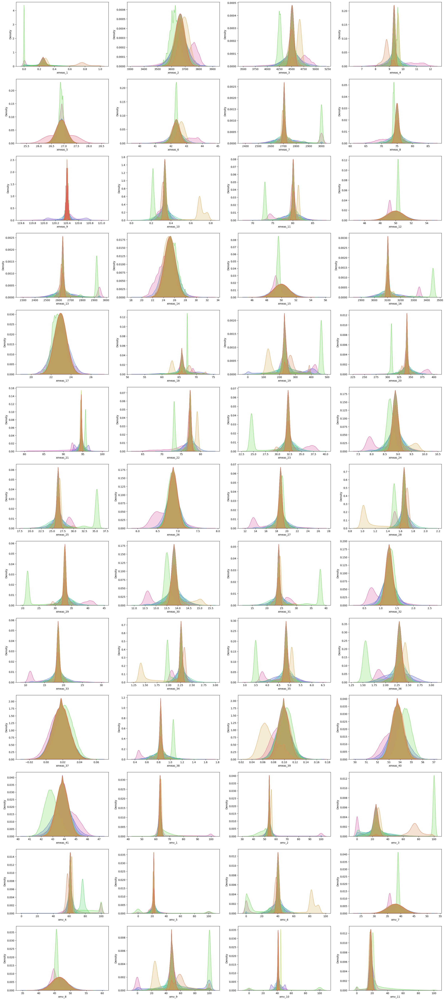

In [17]:
# fig, ax = plt.subplots(13,4,figsize=(30,70))
# for i,column in enumerate(df.columns[3:]):   #select all the feature columns to plot
#     sns.kdeplot(data=df, x=column, hue="faultNumber",palette="hls",ax=ax.ravel()[i],fill=True, legend=False)

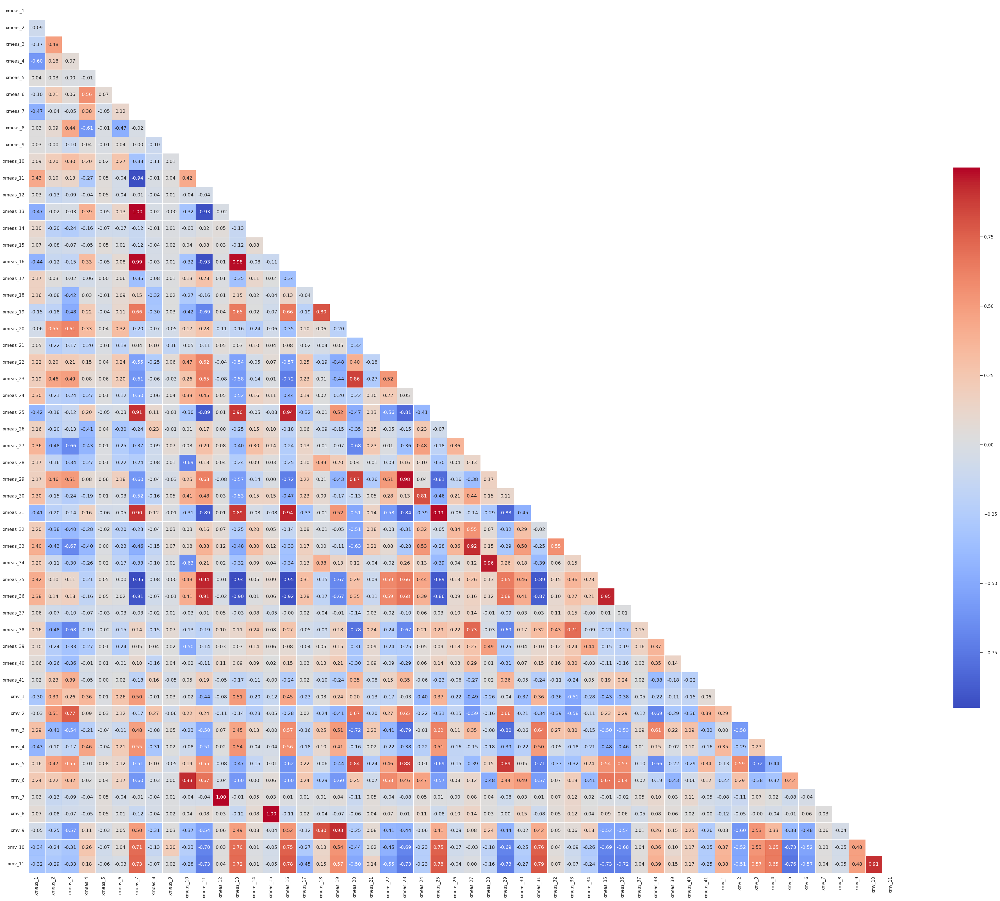

In [18]:
# # Load the data into a pandas DataFrame
# data = df[df['simulationRun']==1].iloc[:,3:]

# # Calculate the correlation matrix
# corr = data.corr()

# # Create a heatmap with annotations
# sns.set(style='white')
# mask = np.triu(np.ones_like(corr, dtype=bool))
# f, ax = plt.subplots(figsize=(50, 50))
# sns.heatmap(corr, mask=mask, cmap='coolwarm', annot=True, fmt='.2f',
#             square=True, linewidths=.5, cbar_kws={"shrink": .5})
# plt.show()

In [19]:
# corr_matrix = data.corr()
# upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape),k=1).astype(bool))
# to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.90)]
# print("No. of Columns to drop",len(to_drop))
# to_drop

No. of Columns to drop 14


['xmeas_13',
 'xmeas_16',
 'xmeas_25',
 'xmeas_29',
 'xmeas_31',
 'xmeas_33',
 'xmeas_34',
 'xmeas_35',
 'xmeas_36',
 'xmv_6',
 'xmv_7',
 'xmv_8',
 'xmv_9',
 'xmv_11']

In [3]:
to_drop = ['xmeas_13',
 'xmeas_16',
 'xmeas_25',
 'xmeas_29',
 'xmeas_31',
 'xmeas_33',
 'xmeas_34',
 'xmeas_35',
 'xmeas_36',
 'xmv_6',
 'xmv_7',
 'xmv_8',
 'xmv_9',
 'xmv_11']

# Supervised ML Approach


In [6]:
def wrangle(df,drop,simulation):
    reduced_data =df[(df['simulationRun'] >simulation[0] ) & (df['simulationRun'] <simulation[1] ) & (df['sample']>20)]
    if drop != None:
        reduced_data = reduced_data.drop(columns=to_drop, axis=1)
    reduced_data = reduced_data[reduced_data['faultNumber'] != 3]
    reduced_data = reduced_data[reduced_data['faultNumber'] != 9]
    reduced_data = reduced_data[reduced_data['faultNumber'] != 15]
    return reduced_data
reu_df = wrangle(df,drop=None,simulation=[1,20])
# reu_dft = wrangle(dft,drop=None,simulation=[1,4])
reu_df_drop = wrangle(df,drop=to_drop,simulation=[1,20])
# reu_dft_drop = wrangle(dft,drop=to_drop,simulation=[1,4])

In [7]:
sc = StandardScaler()
sc.fit(reu_df.iloc[:,3:])

X = sc.transform(reu_df.iloc[:,3:])
Y = reu_df['faultNumber']
le = LabelEncoder()
Y_enc = le.fit_transform(Y)

x_train, x_test, y_train, y_test = train_test_split(X, Y_enc, test_size=0.2, random_state=42)


In [9]:
len(reu_df.iloc[:,3:].columns)

52

In [10]:
type(Y_enc)

numpy.ndarray

In [12]:
X.shape

(155520, 52)

In [30]:
# def split(use_sklearn, reduced_data, sc):
#     X = sc.transform(reduced_data.iloc[:,3:])
#     Y = reduced_data['faultNumber']
#     le = LabelEncoder()
#     Y_enc = le.fit_transform(Y)
#     if use_sklearn is not None:
#         x_train, x_test, y_train, y_test = train_test_split(X, Y_enc, test_size=0.2, random_state=42)
#         return x_train, x_test, y_train, y_test
#     else:
#         return X, Y_enc



# x_train, y_train = split(use_sklearn=None, reduced_data=reu_df, sc=sc)
# x_test, y_test = split(use_sklearn=None, reduced_data=reu_dft, sc=sc)
# x_train, x_test, y_train, y_test = split(use_sklearn="use", reduced_data=reu_df, sc=sc)

## With Tree based ensembles

In [52]:
x_train

array([[-0.51094342,  1.69216389,  0.65944862, ...,  0.05511975,
        -0.21888544,  0.22299588],
       [ 0.2719047 , -0.18690039, -0.06191411, ..., -0.34199446,
         0.34291703, -0.16850446],
       [-0.09508277, -0.67893026, -0.13996881, ..., -0.55632036,
        -0.11803242, -0.05413602],
       ...,
       [ 0.16143878, -0.52753645,  0.5050547 , ..., -0.55264187,
         0.34347474,  0.29873513],
       [-0.40461292, -0.05999676,  0.33693687, ..., -0.08617739,
        -0.04980558, -0.33756143],
       [ 0.02891727, -0.27150281, -0.02588886, ..., -0.10229782,
        -0.0949803 , -0.15721953]])

In [55]:
# joblib.dump(le, 'model/label_encoder.pkl')
# joblib.dump(sc, 'model/standard_scalar.pkl')

['model/standard_scalar.pkl']

In [14]:
print("Shape of x_train:", x_train.shape)  # Assuming x_train is a NumPy array
print("Shape of y_train:", y_train.shape)  # Assuming y_train is a NumPy array
print("Shape of x_test:", x_test.shape)    # Assuming x_test is a NumPy array
print("Shape of y_test:", y_test.shape)    # Assuming y_test is a NumPy array

Shape of x_train: (124416, 52)
Shape of y_train: (124416,)
Shape of x_test: (31104, 52)
Shape of y_test: (31104,)


In [50]:


# # Create an instance of each algorithm
# logreg = LogisticRegression(max_iter=10000)
# svm = SVC()
# dt = DecisionTreeClassifier()
# rf = RandomForestClassifier()
# nb = GaussianNB()
# knn = KNeighborsClassifier()
# xg = xgb.XGBClassifier()

# # Train the algorithms on the data
# logreg.fit(x_train, y_train)
# # svm.fit(x_train, y_train)
# dt.fit(x_train, y_train)
# rf.fit(x_train, y_train)
# nb.fit(x_train, y_train)
# knn.fit(x_train, y_train)
# xg.fit(x_train, y_train)
 
# # Use the trained models to make predictions on new data
# y_pred_logreg =logreg.predict(x_test)
# # y_pred_svm = svm.predict(x_test)
# y_pred_dt = dt.predict(x_test)
# y_pred_rf = rf.predict(x_test)
# y_pred_nb = nb.predict(x_test)
# y_pred_knn = knn.predict(x_test)
# y_pred_xg = xg.predict(x_test)

In [51]:
# y_pred_logreg_train =logreg.predict(x_train)
# # y_pred_svm = svm.predict(x_test)
# y_pred_dt_train = dt.predict(x_train)
# y_pred_rf_train = rf.predict(x_train)
# y_pred_nb_train = nb.predict(x_train)
# y_pred_knn_train = knn.predict(x_train)
# y_pred_xg_train = xg.predict(x_train)

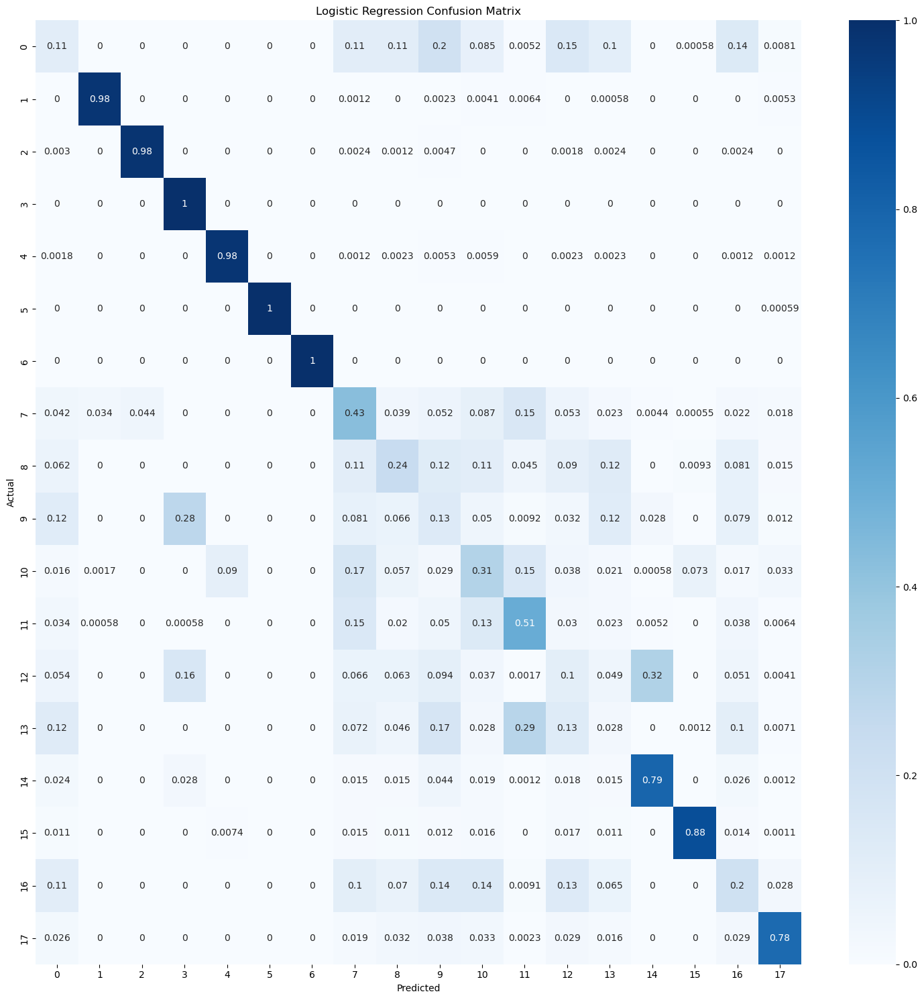

Logistic Regression accuracy_score: 0.5801183127572016


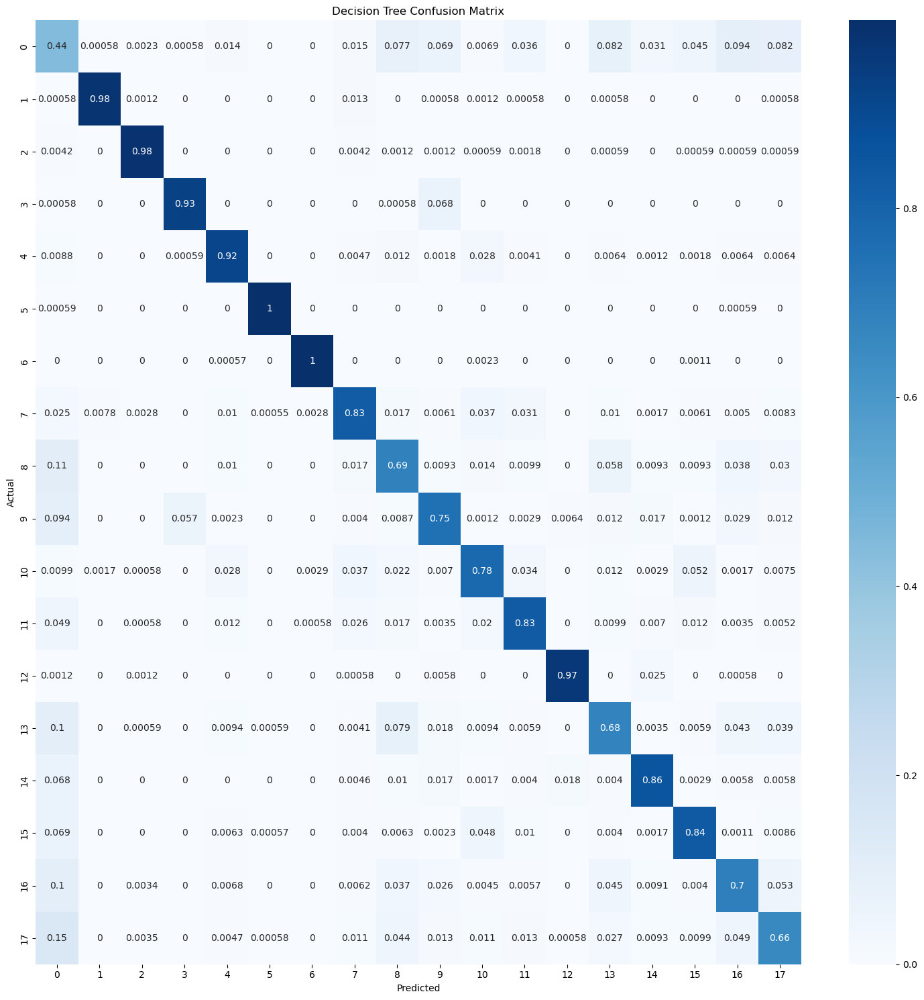

Decision Tree accuracy_score: 0.8238490226337448


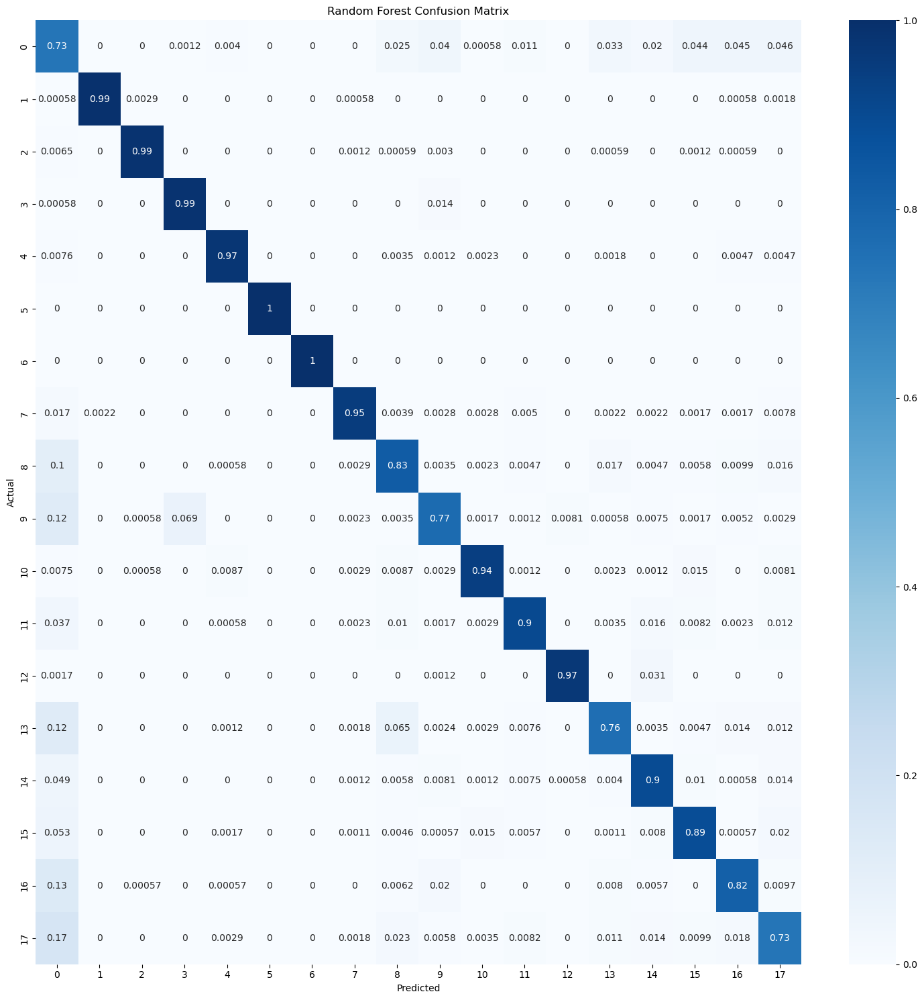

Random Forest accuracy_score: 0.8959297839506173


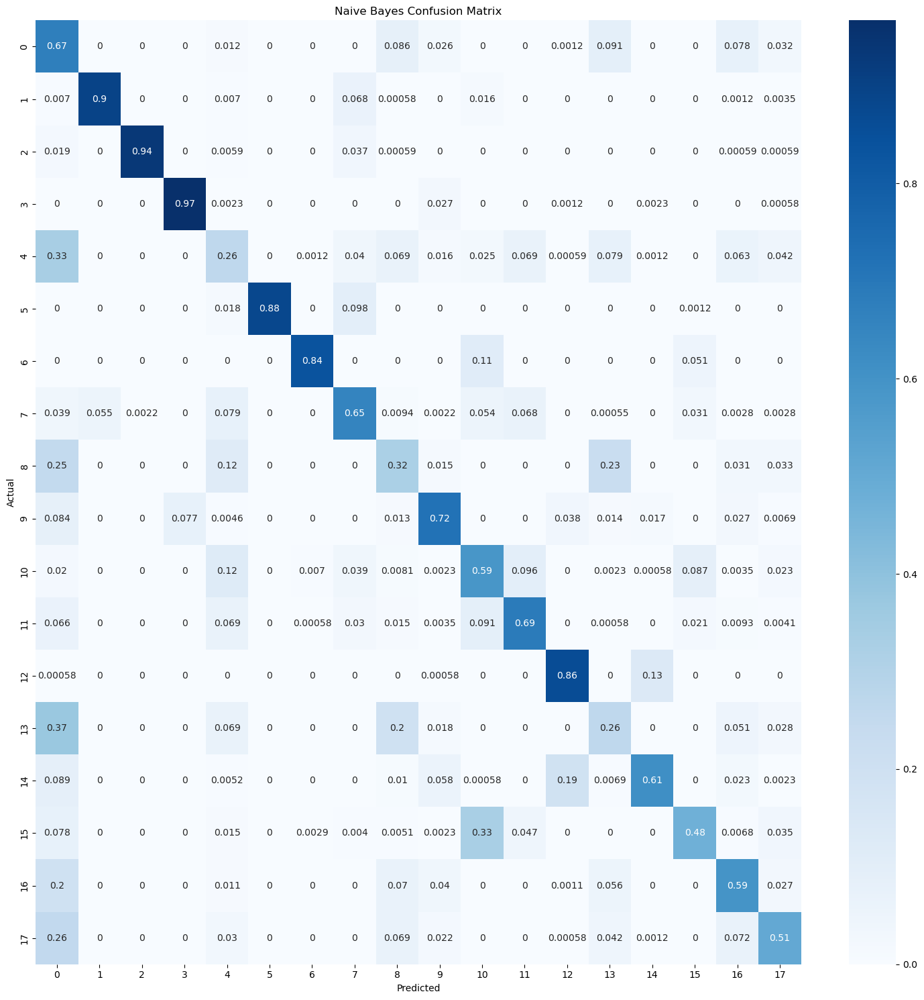

Naive Bayes accuracy_score: 0.6526813271604939


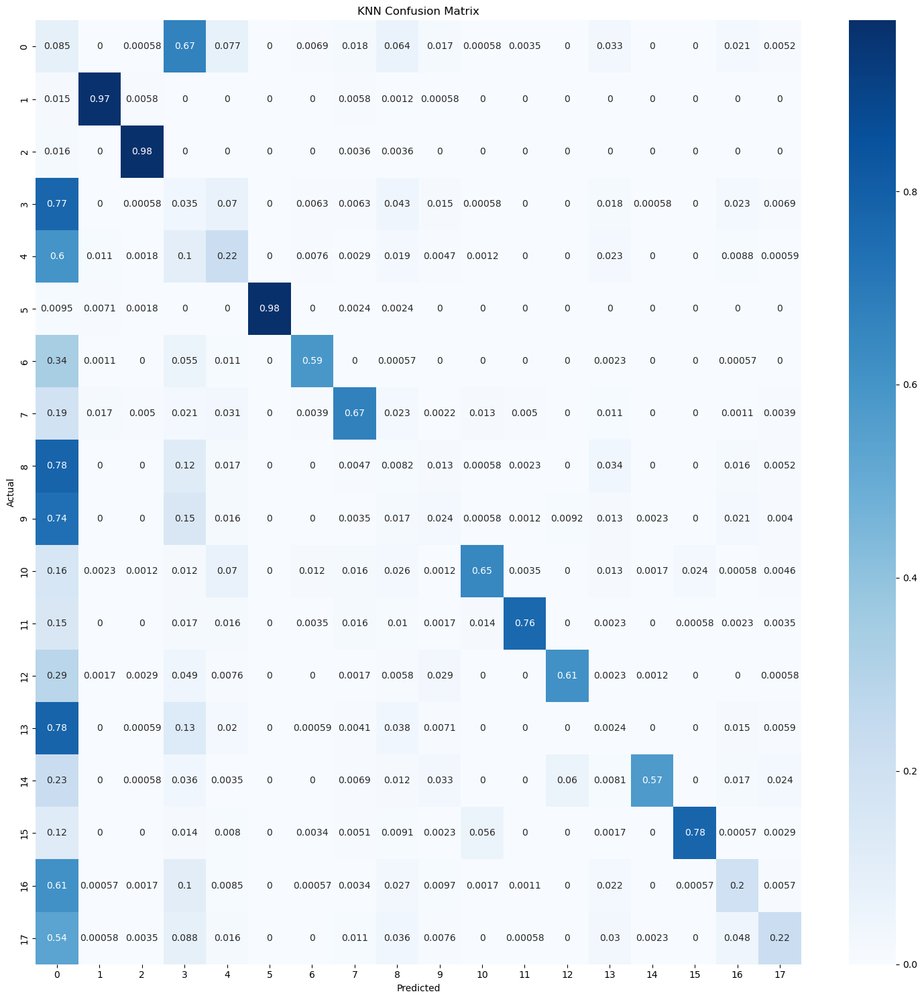

KNN accuracy_score: 0.46405606995884774


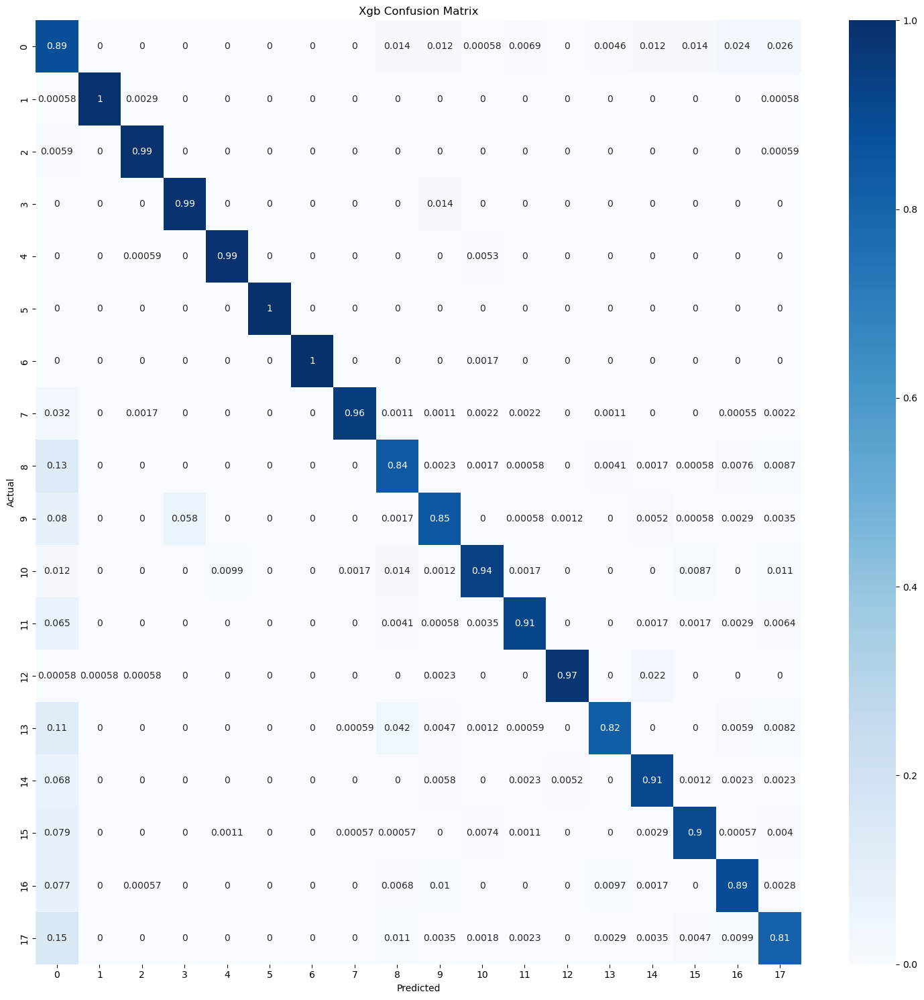

Xgb accuracy_score: 0.925829475308642


In [52]:


# # Create a function to plot the confusion matrix
# def plot_confusion_matrix(y_true, y_pred, title):
#     f, ax = plt.subplots(figsize=(15, 15))
#     cm = confusion_matrix(y_true, y_pred,normalize='true')
#     sns.heatmap(cm, annot=True, cmap='Blues',ax=ax)
#     ax.set_title(title)
#     ax.set_xlabel('Predicted')
#     ax.set_ylabel('Actual')
#     ax.set_ylim(len(cm), 0)
#     plt.tight_layout()
#     plt.show()

# # Plot the confusion matrix and print the f1 score for each algorithm
# plot_confusion_matrix(y_test, y_pred_logreg, 'Logistic Regression Confusion Matrix')
# print("Logistic Regression accuracy_score:", accuracy_score(y_test, y_pred_logreg))

# # plot_confusion_matrix(y_test, y_pred_svm, 'SVM Confusion Matrix')
# # print("SVM accuracy_score:", accuracy_score(y_test, y_pred_svm))

# plot_confusion_matrix(y_test, y_pred_dt, 'Decision Tree Confusion Matrix')
# print("Decision Tree accuracy_score:", accuracy_score(y_test, y_pred_dt))

# plot_confusion_matrix(y_test, y_pred_rf, 'Random Forest Confusion Matrix')
# print("Random Forest accuracy_score:", accuracy_score(y_test, y_pred_rf))

# plot_confusion_matrix(y_test, y_pred_nb, 'Naive Bayes Confusion Matrix')
# print("Naive Bayes accuracy_score:", accuracy_score(y_test, y_pred_nb))

# plot_confusion_matrix(y_test, y_pred_knn, 'KNN Confusion Matrix')
# print("KNN accuracy_score:", accuracy_score(y_test, y_pred_knn))

# plot_confusion_matrix(y_test, y_pred_xg, 'Xgb Confusion Matrix')
# print("Xgb accuracy_score:", accuracy_score(y_test, y_pred_xg))

In [53]:
# # Plot the confusion matrix and print the f1 score for each algorithm
# # plot_confusion_matrix(y_test, y_pred_logreg, 'Logistic Regression Confusion Matrix')
# print("Logistic Regression accuracy_score:", accuracy_score(y_train, y_pred_logreg_train))

# # plot_confusion_matrix(y_test, y_pred_svm, 'SVM Confusion Matrix')
# # print("SVM accuracy_score:", accuracy_score(y_test, y_pred_svm))

# # plot_confusion_matrix(y_test, y_pred_dt, 'Decision Tree Confusion Matrix')
# print("Decision Tree accuracy_score:", accuracy_score(y_train, y_pred_dt_train))

# # plot_confusion_matrix(y_test, y_pred_rf, 'Random Forest Confusion Matrix')
# print("Random Forest accuracy_score:", accuracy_score(y_train, y_pred_rf_train))

# # plot_confusion_matrix(y_test, y_pred_nb, 'Naive Bayes Confusion Matrix')
# print("Naive Bayes accuracy_score:", accuracy_score(y_train, y_pred_nb_train))

# # plot_confusion_matrix(y_test, y_pred_knn, 'KNN Confusion Matrix')
# print("KNN accuracy_score:", accuracy_score(y_train, y_pred_knn_train))

# # plot_confusion_matrix(y_test, y_pred_xg, 'Xgb Confusion Matrix')
# print("Xgb accuracy_score:", accuracy_score(y_train, y_pred_xg_train))

Logistic Regression accuracy_score: 0.5836387602880658
Decision Tree accuracy_score: 0.9859744727366255
Random Forest accuracy_score: 0.9859744727366255
Naive Bayes accuracy_score: 0.6517730838477366
KNN accuracy_score: 0.5820392875514403
Xgb accuracy_score: 0.9662422839506173


In [54]:
cv_acc_scores = cross_val_score(xg, x_test, y_test, cv=5, n_jobs=-1)
print(cv_acc_scores)

[0.9011413  0.89149654 0.89213953 0.89085356 0.88987138]


### Cross Validation

In [56]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300]
}

# 'colsample_bytree': [0.6, 0.8, 1.0],
#     'gamma': [0, 1, 5]    'learning_rate': [0.1, 0.01, 0.001],
#     'n_estimators': [100, 200, 300],
#     'subsample': [0.6, 0.8, 1.0]

# Define the cross-validation strategy
kfold = KFold(n_splits=2, shuffle=True, random_state=42)

# Initialize the XGBoost classifier
xgb_model = xgb.XGBClassifier()

# Initialize the grid search object
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=kfold, n_jobs=-1,verbose=True)

# Fit the grid search object to the data
grid_result = grid_search.fit(x_train, y_train)

# Print the best hyperparameters and their corresponding score
print(f"Best score: {grid_result.best_score_:.4f}")
print("Best hyperparameters:")
for param, value in grid_result.best_params_.items():
    print(f"{param}: {value}")

NameError: name 'KFold' is not defined

### From above analysis, XGB and Random forest Performs well.
### Metrics:

In this series, we will use accuracy as the primary metric for evaluating the performance of the different machine learning algorithms. We will update the table as we evaluate the performance of other algorithms in the subsequently.


Average accuracy score obtained for each method, excluding fault No. 9 and 15 (**No feature were Dropped, all 52 sensor measurements were used**)

| Method                                    |Accuracy  |
|-----------------------------------------  |----------|
| XG Boost                                  |  0.924  |
| Random Forest                           |  0.895   |
| Naive Bayes                                   |  0.652   |
| KNN                               |  0.464   |
| Decision Tree                                  |  0.827   |
| Logistic Regression                                  |  0.695   |

# Explainable AI
## Local

### Lime

In [14]:
import lime
import lime.lime_tabular

In [61]:
lime_explainer = lime.lime_tabular.LimeTabularExplainer(x_train, feature_names=reu_df.columns[3:], training_labels= y_train, discretize_continuous=True)

In [66]:
idx=1
y_pred = xg.predict(np.expand_dims(x_test[idx], axis=0))
# y_pred = enc.inverse_transform(y_pred)[0][0]
print(f"Predicted fault is {y_pred}")
exp = lime_explainer.explain_instance(x_test[idx], xg.predict_proba, num_features=10, top_labels=1)
note = exp.show_in_notebook(show_table=True, show_all=False)


Predicted fault is [7]


In [64]:
joblib.dump(x_train, "explainable_ai/train_data.pkl")
joblib.dump(y_train,  "explainable_ai/train_label.pkl")

['explainable_ai/train_label.pkl']

### Shap

In [12]:
import shap
shap.initjs()

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


#### Tree explainer

In [31]:
import joblib

joblib.dump(x_test[::50], "explainable_ai/x_test.pkl")
joblib.dump(y_test[::50],"explainable_ai/x_test+label.pkl")

['explainable_ai/x_test+label.pkl']

In [10]:
x_test[::50]

array([[-0.36131629, -0.27372919, -0.17770955, ..., -0.27854057,
        -0.15948905,  0.03245414],
       [ 0.21638978,  1.40941369,  0.89018177, ..., -1.6417983 ,
        -0.09349307, -0.55371129],
       [-0.40442494,  0.01570014,  0.22886112, ..., -0.04333385,
        -0.17352482, -0.01420472],
       ...,
       [ 0.03255143,  0.44539138,  1.17066406, ..., -1.46166068,
        -0.04710997, -0.45192988],
       [-1.57367822,  2.75637328,  3.33646773, ..., -1.39999194,
         0.11611391,  0.15506927],
       [-0.2427675 , -1.422541  ,  0.16710355, ..., -0.42973717,
         0.17588211, -0.14940689]])

In [16]:
# explain the model's predictions using SHAP
explainer = shap.TreeExplainer(xg)


shap_values = explainer.shap_values(x_test[::50])
# ntree_limit is deprecated, use `iteration_range` or model slicing instead.
# x_test[::50]
# Visualize the SHAP values for a single example
sampled_test_data = x_test[::50]
sampled_test_labels = y_test[::50]

sample_idx = 45

print(f"the predicted class is: {xg.predict(sampled_test_data[[sample_idx]])}")
cls_index =  sampled_test_labels[sample_idx]
print(f"the Actual class is: {cls_index}")

for fault_cls in range(0,18):
    print(f"Force plot for fault class: {fault_cls}")
    display(shap.force_plot(explainer.expected_value[fault_cls], shap_values[fault_cls][sample_idx],sampled_test_data[sample_idx],feature_names=reu_df.columns[3:]))

[19:25:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0cec3277c4d9d0165-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


the predicted class is: [6]
the Actual class is: 6
Force plot for fault class: 0


Force plot for fault class: 1


Force plot for fault class: 2


Force plot for fault class: 3


Force plot for fault class: 4


Force plot for fault class: 5


Force plot for fault class: 6


Force plot for fault class: 7


Force plot for fault class: 8


Force plot for fault class: 9


Force plot for fault class: 10


Force plot for fault class: 11


Force plot for fault class: 12


Force plot for fault class: 13


Force plot for fault class: 14


Force plot for fault class: 15


Force plot for fault class: 16


Force plot for fault class: 17


In [22]:
joblib.dump(explainer, 'explainable_ai/shap_tree_explainer.pkl')


['explainable_ai/shap_tree_explainer.pkl']

### Premutation 

In [93]:
from sklearn.inspection import permutation_importance
result = permutation_importance(xg, x_test[::50], y_test[::50], n_repeats=10, random_state=42)

# Get feature importances and standard deviations
importances = result.importances_mean
std_devs = result.importances_std

In [94]:
# Print feature importances
# for feature, importance, std_dev in zip(reu_df.iloc[:,3:].columns, importances, std_devs):
#     print(f"{feature}: {importance:.4f} ± {std_dev:.4f}")

res = pd.DataFrame(importances, columns=["Importances"])
res["std_dev"] = std_devs
res["features"] = reu_df.iloc[:,3:].columns
res["permutation_importance"] = res.Importances.round(5).astype("str") + "±" + res.std_dev.round(5).astype("str")
res.sort_values("Importances",inplace=True,ascending=False)
# str(res.Importances) + "±" + str(res.std_dev)

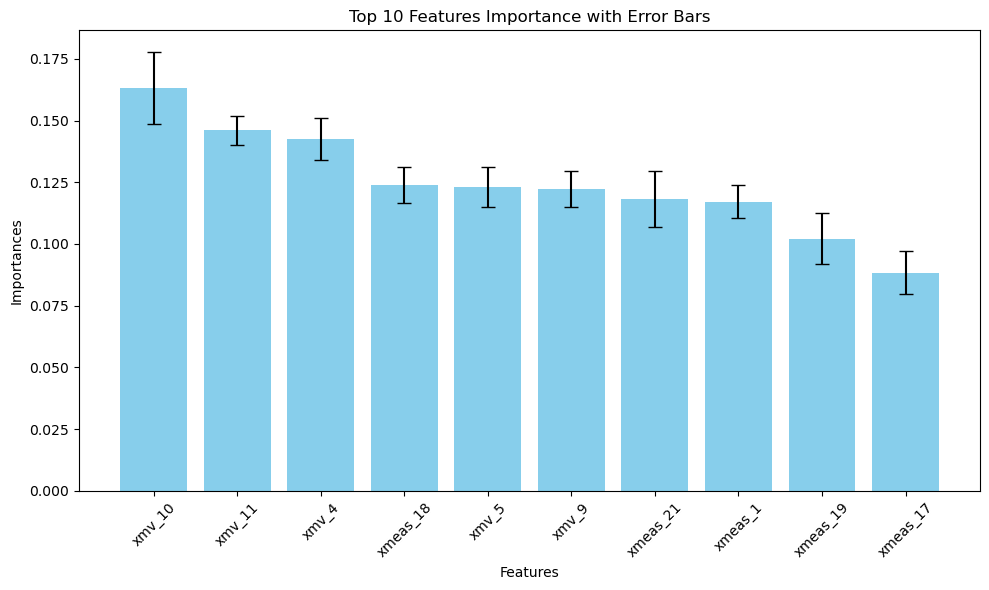

In [95]:
plt.figure(figsize=(10, 6))
plt.bar(res['features'].head(10), res['Importances'].head(10), yerr=res['std_dev'].head(10), capsize=5, color='skyblue')
plt.xlabel('Features')
plt.ylabel('Importances')
plt.title('Top 10 Features Importance with Error Bars')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()

### Partial dependence

### Shap

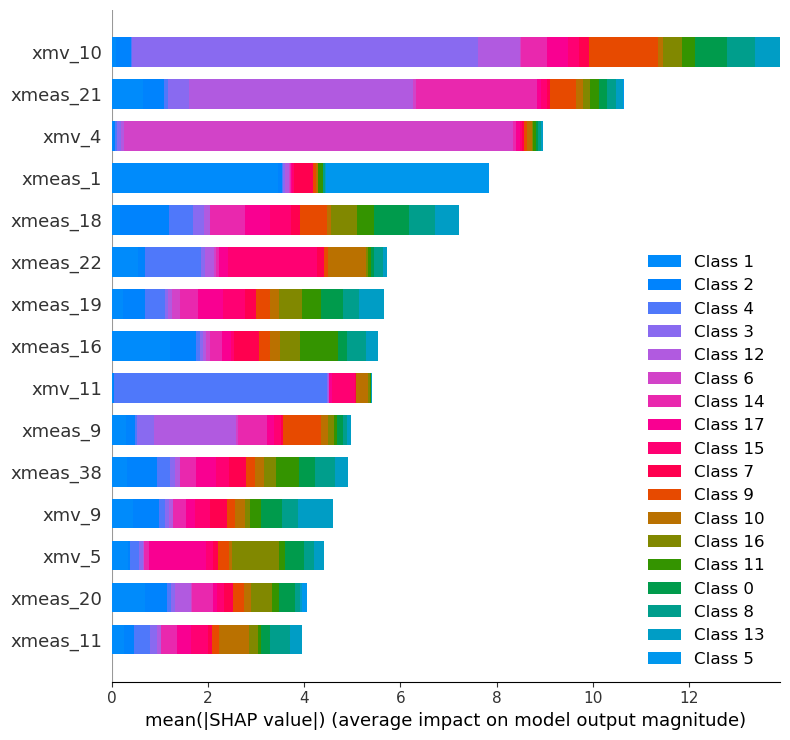

In [20]:
fig = shap.summary_plot(shap_values,feature_names=reu_df.iloc[:,3:].columns, max_display=15)
plt.show()

### From above analysis, XGB and Random forest Performs well.
### Metrics:

In this series, we will use accuracy as the primary metric for evaluating the performance of the different machine learning algorithms. We will update the table as we evaluate the performance of other algorithms in the subsequently.


Average accuracy score obtained for each method, excluding fault No. 9 and 15 (**No feature were Dropped, all 52 sensor measurements were used**)

| Method                                    |Accuracy  |
|-----------------------------------------  |----------|
| XG Boost                                  |  0.924  |
| Random Forest                           |  0.895   |
| Naive Bayes                                   |  0.652   |
| KNN                               |  0.464   |
| Decision Tree                                  |  0.827   |
| Logistic Regression                                  |  0.695   |

# communicating result
## For Non-technical
### Real time Fault Prediction

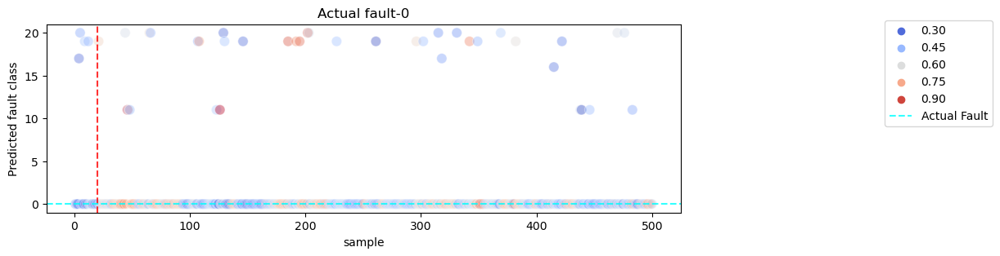

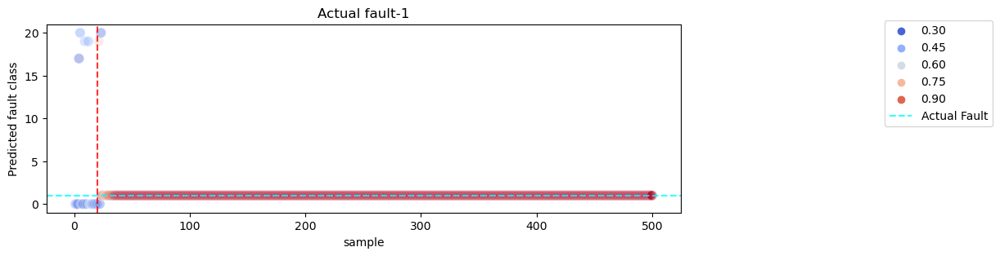

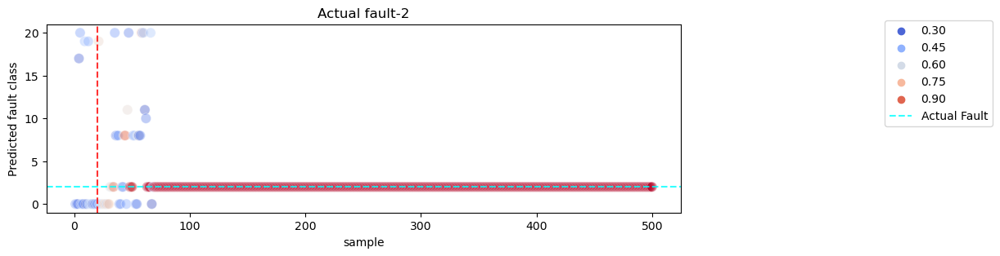

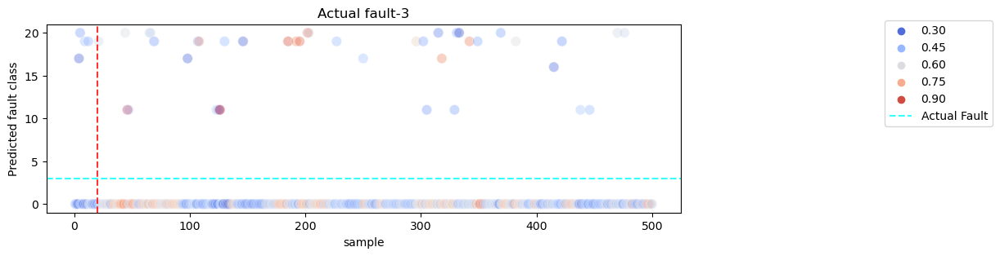

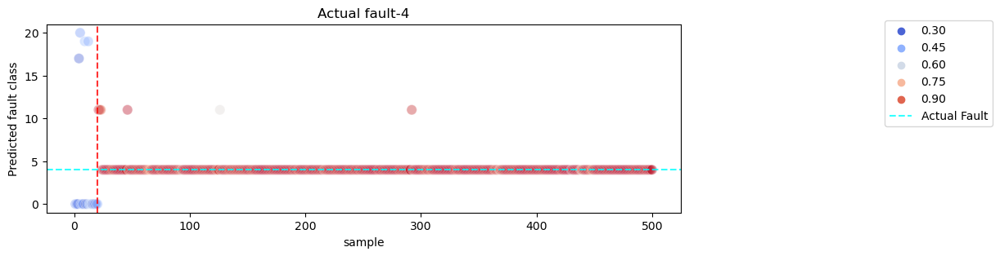

...

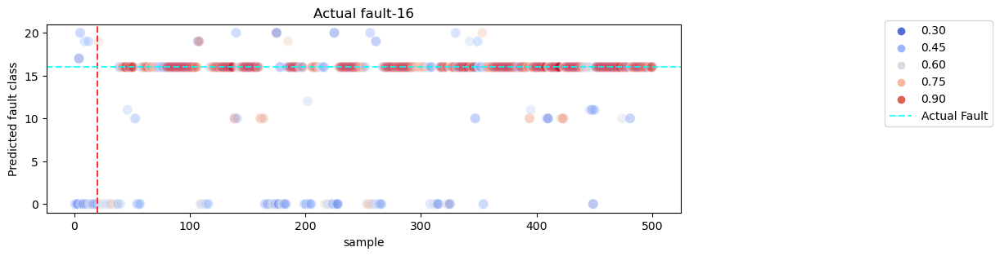

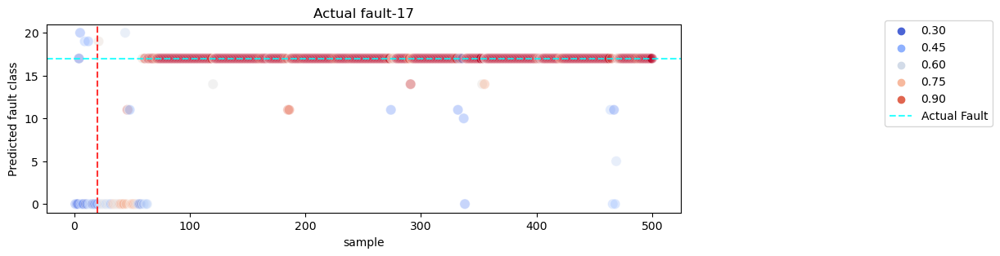

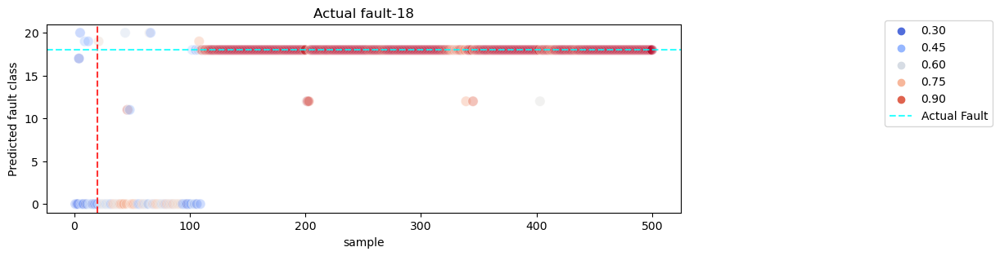

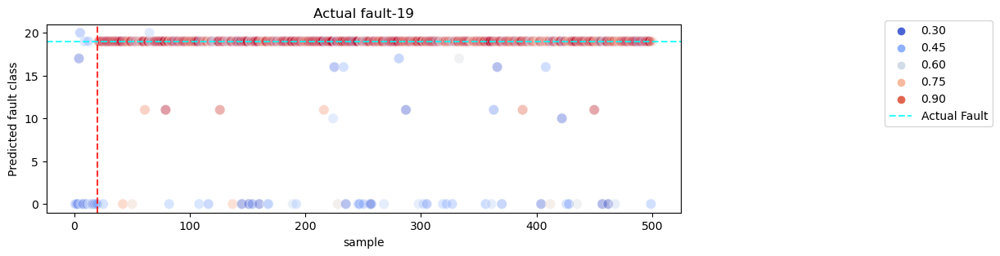

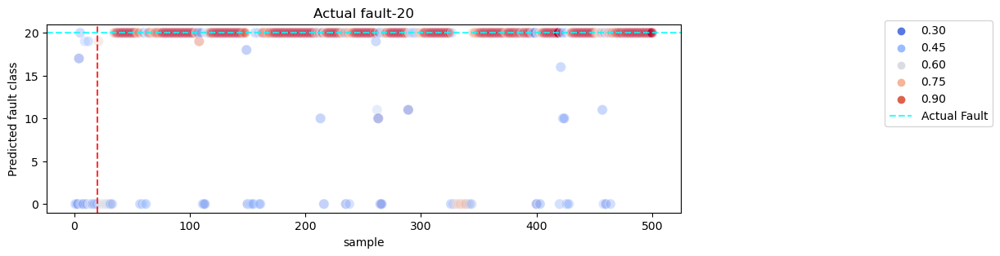

In [101]:
for F_num in range(0,21):
    df_new= df[(df['faultNumber']==F_num) & (df['simulationRun']==1)].copy()
    x_new = df_new.iloc[:,3:]
    x_new = sc.transform(x_new)
    y_pred = xg.predict(x_new)
    y_pred = le.inverse_transform(y_pred)
    y_proba = np.max(xg.predict_proba(x_new),axis=1)

    f, ax = plt.subplots(figsize=(10,3))
    sns.scatterplot(x=df_new['sample'],y=y_pred,hue=y_proba,palette="coolwarm",s=80,alpha=0.4)
    plt.axvline(20,c='r',alpha=0.8,linestyle ='--')
    plt.axhline(F_num,c='cyan',alpha=0.8,label='Actual Fault',linestyle ='--')
    plt.legend(bbox_to_anchor=(1.5, 1.05))
    plt.ylabel('Predicted fault class')
    plt.title(f'Actual fault-{F_num}')
    plt.show()

### Visualize diffrent types of faults
Fault no 3,9,15,19,20

In [ ]:
faultFree = df[(df['faultNumber']==0)&(df['simulationRun']==1)]
faulty = df[(df['faultNumber']==9)&(df['simulationRun']==1)]


fig, ax = plt.subplots(13,4,figsize=(30,70))

for i,col in enumerate(df.iloc[:,3:]):  #select all the feature columns to plot
    ax.ravel()[i].plot(faultFree['sample'],faultFree[col],label='FaultFree')
    ax.ravel()[i].plot(faulty['sample'],faulty[col],label='Faulty',alpha=0.6)
    ax.ravel()[i].set_xlabel('sample no.')
    ax.ravel()[i].set_ylabel(col)
    ax.ravel()[i].legend()

In [ ]:
Acc=[]
for Fnum in [x for x in range(0,21) if x not in [3,9,15]]:

    temp_df = df[ (df['faultNumber']==Fnum) & (df['sample']>20) & (df['simulationRun']==np.random.randint(1,500))].copy()
    X_faulty = sc.transform(temp_df.iloc[:,3:])
    y_true =temp_df['faultNumber']
    
    y_pred = xg.predict(X_faulty)
    y_pred = le.inverse_transform(y_pred)
    
    acc = accuracy_score(y_true, y_pred)
    print(f'The accuracy for Fault_num={Fnum} is {acc}')
    Acc.append(acc)
    
print('#'*20)
print(f'The overall average accuracy of XG boost is {np.mean(Acc)}')

## For Technical

In [42]:
joblib.dump(logreg, 'model/logistic_regression_model.pkl')
joblib.dump(dt, 'model/decision_tree_model.pkl')
joblib.dump(rf, 'model/random_forest_model.pkl')
joblib.dump(nb, 'model/naive_bayes_model.pkl')
joblib.dump(knn, 'model/knn_model.pkl')
joblib.dump(xg, 'model/xgboost_model.pkl')


['model/xgboost_model.pkl']

In [9]:
import joblib

logreg = joblib.load('model/logistic_regression_model.pkl')
dt = joblib.load('model/decision_tree_model.pkl')
rf = joblib.load('model/random_forest_model.pkl')
nb = joblib.load('model/naive_bayes_model.pkl')
knn = joblib.load('model/knn_model.pkl')
xg = joblib.load('model/xgboost_model.pkl')
sc = joblib.load('model/standard_scalar.pkl')

In [18]:
from explainerdashboard import ClassifierExplainer, ExplainerDashboard
from explainerdashboard.datasets import titanic_embarked, feature_descriptions

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [16]:
feature_descriptions

{'Sex': 'Gender of passenger',
 'Gender': 'Gender of passenger',
 'Deck': 'The deck the passenger had their cabin on',
 'PassengerClass': 'The class of the ticket: 1st, 2nd or 3rd class',
 'Fare': 'The amount of money people paid for their ticket',
 'Embarked': 'the port where the passenger boarded the Titanic. Either Southampton, Cherbourg or Queenstown',
 'Age': 'Age of the passenger',
 'No_of_siblings_plus_spouses_on_board': 'The sum of the number of siblings plus the number of spouses on board',
 'No_of_parents_plus_children_on_board': 'The sum of the number of parents plus the number of children on board'}

In [26]:
type(le.classes_)

numpy.ndarray

In [41]:
ls = list(set(y_test))
ls1 = [str(n) for n in ls] 
ls1

['0',
 '1',
 '2',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17']

In [42]:
explainer = ClassifierExplainer(xg, x_test, y_test,  
                                descriptions=X_dict,
                                labels=ls1,
                                pos_label=ls1[0]
                                )

ExplainerDashboard(explainer).run()

Detected XGBClassifier model: Changing class type to XGBClassifierExplainer...
model_output=='probability' does not work with multiclass XGBClassifier models, so settings model_output='logodds'...
Generating self.shap_explainer = shap.TreeExplainer(model)


c:\Users\Lenovo\anaconda3\Lib\site-packages\xgboost\core.py:160: UserWarning:

[22:40:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0cec3277c4d9d0165-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.



Building ExplainerDashboard..
Detected notebook environment, consider setting mode='external', mode='inline' or mode='jupyterlab' to keep the notebook interactive while the dashboard is running...
Generating layout...
Calculating shap values...
Calculating prediction probabilities...
Calculating metrics...
Calculating confusion matrices...
Calculating classification_dfs...
Calculating roc auc curves...
Calculating pr auc curves...
Calculating liftcurve_dfs...
Calculating shap interaction values... (this may take a while)
Reminder: TreeShap computational complexity is O(TLD^2), where T is the number of trees, L is the maximum number of leaves in any tree and D the maximal depth of any tree. So reducing these will speed up the calculation.


In [4]:
4 * np.random.rand(20) - 2 

array([-0.32548851, -1.45343571, -1.45063936, -1.19166755, -1.6841183 ,
       -0.90119334,  0.05332572, -1.77947077,  1.69114621, -0.45051664,
        0.12927298,  0.88303524,  1.11173939, -0.87363312, -0.85796544,
       -1.41646361, -0.06956797,  1.54379356, -0.20260328, -1.04607805])